In [2]:
import base64
from glob import glob
import io
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from PIL import Image
from random import seed
import seaborn as sns
import shutil
import tempfile

In [3]:
path_to_drive = '/Volumes/Seagate Portable Drive'
db_path = '/Volumes/Seagate Portable Drive/KYLE_AI_DATABASE/Detections_inventory/Detections inventory_2023.08.29.xlsx'
db = pd.read_excel(db_path, sheet_name=1)
db['Folder path'] = db['Folder path'].str.replace('D:', path_to_drive).str.replace('\\', '/')
db['Marks'] = db['Marks'].str.replace(' marks', '')
db = db.rename(columns=str.lower)
db['ymdh'] = db['year'].astype(str) + db['date-time'].str.replace('.', '').str.replace('-','')
db.drop(columns=['date-time', 'link'], inplace=True)
db = db.rename(columns={'type': 'color', 'folder path': 'folder_path'})
db['color'] = db['color'].apply(lambda x: 1 if x == 'COLOR' else 0)
db = db[db['marks'] != 'Unsorted']
db['label'] = db['marks'].map({'No': 0, 'Partial': 1, 'Robust': 2})
db['label'] = db['label'].astype(int)

In [4]:
images_df = pd.DataFrame()

rows_to_add = []  # A list to collect new rows

for index, row in db.iterrows():
    file_paths = glob(row['folder_path'] + '/*.JPG')
    for file_path in file_paths:
        new_row = row.copy()
        new_row['file_path'] = file_path  # Assign the file path to the new column
        #new_row['file_size'] = os.path.getsize(file_path)  # Assign the image size to the new column
        rows_to_add.append(new_row)  # Append the new row to the list

# Convert the list of rows into a DataFrame and append it to images_df
new_rows_df = pd.DataFrame(rows_to_add)
images_df = pd.concat([images_df, new_rows_df], ignore_index=True)
images_df.drop(columns=['folder_path'], inplace=True)

In [5]:
def sample_group(group, n=100,seed=1984):
    # If the group has 10 or more rows, sample ten rows
    if len(group) > n:
        return group.sample(n=n, random_state=seed)
    # If the group has fewer than ten rows, return the entire group
    # You can adjust this behavior as needed
    else:
        return group

sampled_db = images_df.groupby(['marks','id']).apply(sample_group).reset_index(drop=True)
sampled_db['file_size'] = sampled_db['file_path'].apply(lambda x: os.path.getsize(x))

/var/folders/vp/1c12nhtx09ng562vszvlczthvwd07y/T/ipykernel_78404/3760935518.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_db = images_df.groupby(['marks','id']).apply(sample_group).reset_index(drop=True)


In [6]:
sampled_db

,group,species,id,station,year,color,marks,ymdh,label,file_path,file_size
0,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1479631
1,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1472923
2,Focal_species,Gulo gulo,BDF10-M6,HC,2020,0,No,202004090034,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1778966
3,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1233951
4,Focal_species,Gulo gulo,BDF10-M6,JC,2020,1,No,202004130716,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,2786236
...,...,...,...,...,...,...,...,...,...,...,...
2770,Focal_species,Gulo gulo,Turk,JC,2022,1,Robust,202203130720,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1985720
2771,Focal_species,Gulo gulo,Turk,DM,2022,1,Robust,202203030937,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,2766428
2772,Focal_species,Gulo gulo,Turk,FG,2022,0,Robust,202203252025,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1596821
2773,Focal_species,Gulo gulo,Turk,JC,2022,0,Robust,202202062022,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1533588


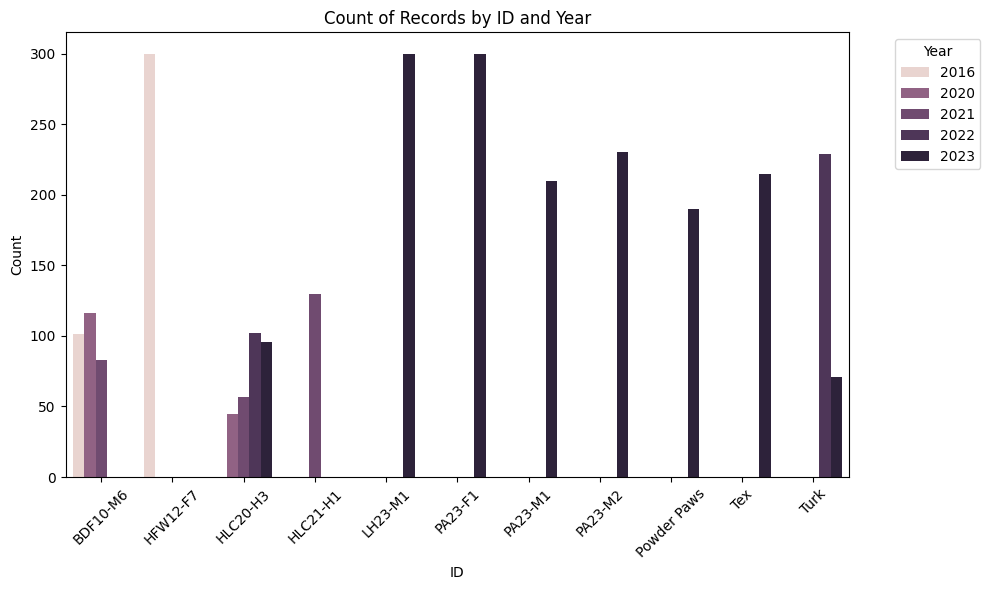

In [7]:
plt.figure(figsize=(10, 6))
sns.countplot(x='id', hue='year', data=sampled_db)
plt.title('Count of Records by ID and Year')
plt.xlabel('ID')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.tight_layout()  # Adjust layout to not cut off labels
plt.show()

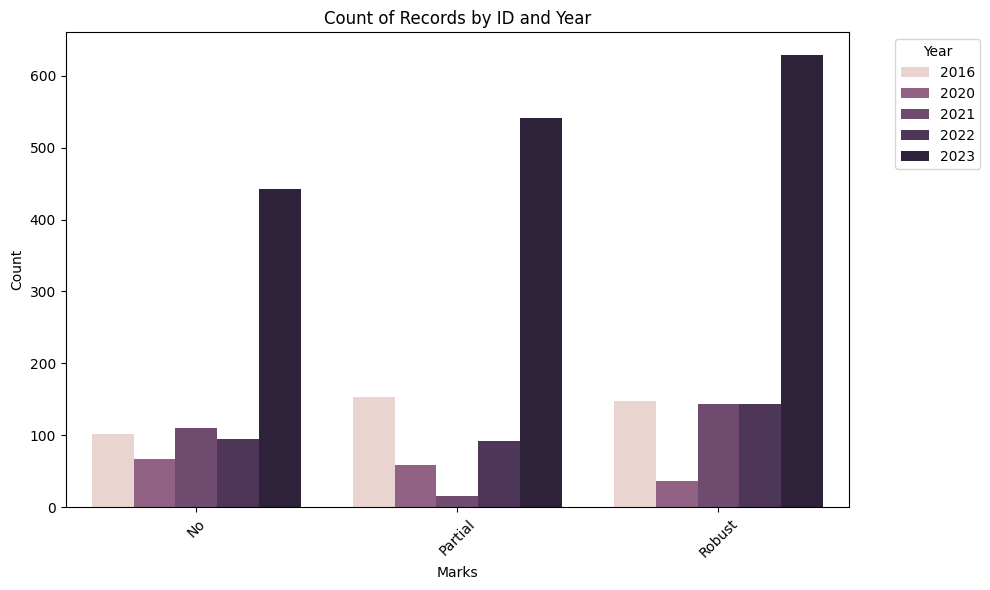

In [8]:
plt.figure(figsize=(10, 6))
sns.countplot(x='marks', hue='year', data=sampled_db)
plt.title('Count of Records by ID and Year')
plt.xlabel('Marks')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.tight_layout()  # Adjust layout to not cut off labels
plt.show()

In [9]:
unique_ymdh = sampled_db['ymdh'].unique()
unique_ymdh_sorted = np.sort(unique_ymdh)[::-1]  # Sort in descending order

# Step 2: Determine the cut-off for the first 20%
cutoff_index = int(len(unique_ymdh_sorted) * 0.2)
test_ymdh_values = unique_ymdh_sorted[:cutoff_index]

# Step 3: Split the DataFrame
test_df = sampled_db[sampled_db['ymdh'].isin(test_ymdh_values)]
train_df = sampled_db[~sampled_db['ymdh'].isin(test_ymdh_values)]

In [10]:
np.max(test_df['ymdh']), np.min(test_df['ymdh']), np.max(train_df['ymdh']), np.min(train_df['ymdh'])

('202305070247', '202303111847', '202303111844', '201601300915')

In [11]:
len(test_df), len(train_df)

(511, 2264)

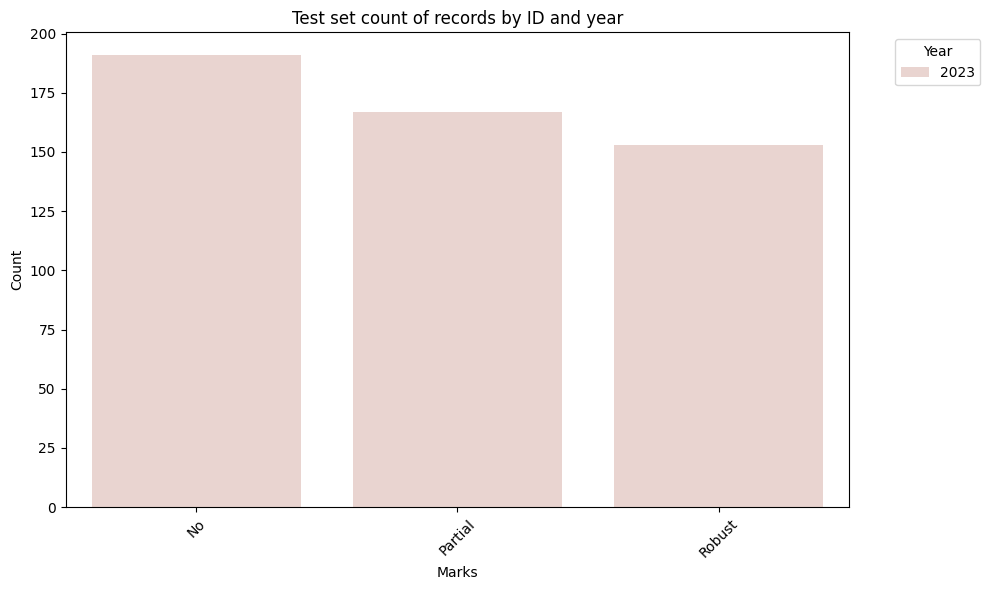

In [12]:
plt.figure(figsize=(10, 6))
sns.countplot(x='marks', hue='year', data=test_df)
plt.title('Test set count of records by ID and year')
plt.xlabel('Marks')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.tight_layout()  # Adjust layout to not cut off labels
plt.show()

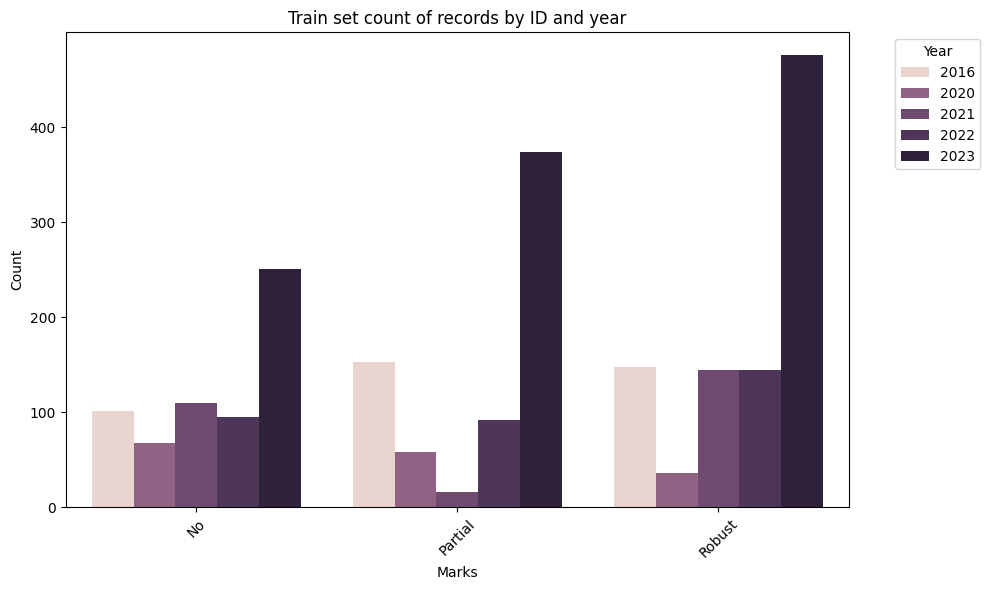

In [13]:
plt.figure(figsize=(10, 6))
sns.countplot(x='marks', hue='year', data=train_df)
plt.title('Train set count of records by ID and year')
plt.xlabel('Marks')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place the legend outside the plot
plt.tight_layout()  # Adjust layout to not cut off labels
plt.show()

In [14]:
total_file_size_gb = sampled_db['file_size'].sum() / (1024**3)
total_file_size_gb

3.6657401733100414

In [15]:
train_df

,group,species,id,station,year,color,marks,ymdh,label,file_path,file_size
0,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1479631
1,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1472923
2,Focal_species,Gulo gulo,BDF10-M6,HC,2020,0,No,202004090034,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1778966
3,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1233951
4,Focal_species,Gulo gulo,BDF10-M6,JC,2020,1,No,202004130716,0,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,2786236
...,...,...,...,...,...,...,...,...,...,...,...
2770,Focal_species,Gulo gulo,Turk,JC,2022,1,Robust,202203130720,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1985720
2771,Focal_species,Gulo gulo,Turk,DM,2022,1,Robust,202203030937,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,2766428
2772,Focal_species,Gulo gulo,Turk,FG,2022,0,Robust,202203252025,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1596821
2773,Focal_species,Gulo gulo,Turk,JC,2022,0,Robust,202202062022,2,/Volumes/Seagate Portable Drive/KYLE_AI_DATABA...,1533588


In [16]:
def encode_image(image_path, format='JPEG', quality=85):
    # Open and optionally resize the image here if needed
    with Image.open(image_path) as img:
        img_byte_arr = io.BytesIO()
        # Compress the image
        img.save(img_byte_arr, format=format, quality=quality)
        img_byte_arr = img_byte_arr.getvalue()
    return img_byte_arr

def parquet_image_dataset(data, file_path, prefix, chunk_sz, output_dir, format='JPEG', quality=85): 
    # Chunking logic remains the same
    data['cumsum_size'] = (data['file_size'] / (1024 * 1024)).cumsum()
    data['chunk'] = (data['cumsum_size'] / chunk_sz).astype(int)

    for chunk_id, chunk_data in data.groupby('chunk'):
        print(f"Encoding images chunk {chunk_id}...")
        # Encode and compress images
        chunk_data['image'] = chunk_data[file_path].apply(lambda x: encode_image(x, format=format, quality=quality))
        # Drop unnecessary columns
        chunk_data = chunk_data.drop(columns=[file_path, 'cumsum_size', 'chunk', 'file_size'])
        file_name = f"{prefix}_{chunk_id}.parquet"
        print(f"Saving chunk {chunk_id} to {file_name}")
        chunk_data.to_parquet(os.path.join(output_dir, file_name), index=False)

In [158]:
# def read_image_binary(file_path):
#     with open(file_path, 'rb') as file:
#         return file.read()

# def parquet_image_dataset(data, file_path, prefix, chunk_sz, output_dir): 
#     # Chunking and saving logic remains the same
#     data['cumsum_size'] = (data['file_size'] / (1024 * 1024)).cumsum()
#     data['chunk'] = (data['cumsum_size'] / chunk_sz).astype(int)

#     for chunk_id, chunk_data in data.groupby('chunk'):
#         print(f"Encoding images chunk {chunk_id}...")
#         encoded = chunk_data[file_path].apply(lambda x: read_image_binary(x))
#         chunk_data.insert(0, 'image', encoded)
#         chunk_data = chunk_data.drop(columns=[file_path])  # Drop the original file_path column
#         chunk_data = chunk_data.drop(columns=['cumsum_size', 'chunk','file_size'])
#         file_name = f"{prefix}_{chunk_id}.parquet"
#         print(f"Saving chunk {chunk_id} to {file_name}")
#         chunk_data.to_parquet(os.path.join(output_dir, file_name), index=False)

In [17]:
od = 'data/parquet'
os.makedirs(od, exist_ok=True)
parquet_image_dataset(train_df, 'file_path', 'train', 500, od)
parquet_image_dataset(test_df, 'file_path', 'test', 500, od)

/var/folders/vp/1c12nhtx09ng562vszvlczthvwd07y/T/ipykernel_78404/3358996798.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cumsum_size'] = (data['file_size'] / (1024 * 1024)).cumsum()
/var/folders/vp/1c12nhtx09ng562vszvlczthvwd07y/T/ipykernel_78404/3358996798.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['chunk'] = (data['cumsum_size'] / chunk_sz).astype(int)


Encoding images chunk 0...
Saving chunk 0 to train_0.parquet
Encoding images chunk 1...
Saving chunk 1 to train_1.parquet
Encoding images chunk 2...
Saving chunk 2 to train_2.parquet
Encoding images chunk 3...
Saving chunk 3 to train_3.parquet
Encoding images chunk 4...
Saving chunk 4 to train_4.parquet
Encoding images chunk 5...
Saving chunk 5 to train_5.parquet
Encoding images chunk 6...
Saving chunk 6 to train_6.parquet
Encoding images chunk 0...


/var/folders/vp/1c12nhtx09ng562vszvlczthvwd07y/T/ipykernel_78404/3358996798.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cumsum_size'] = (data['file_size'] / (1024 * 1024)).cumsum()
/var/folders/vp/1c12nhtx09ng562vszvlczthvwd07y/T/ipykernel_78404/3358996798.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['chunk'] = (data['cumsum_size'] / chunk_sz).astype(int)


Saving chunk 0 to test_0.parquet
Encoding images chunk 1...
Saving chunk 1 to test_1.parquet


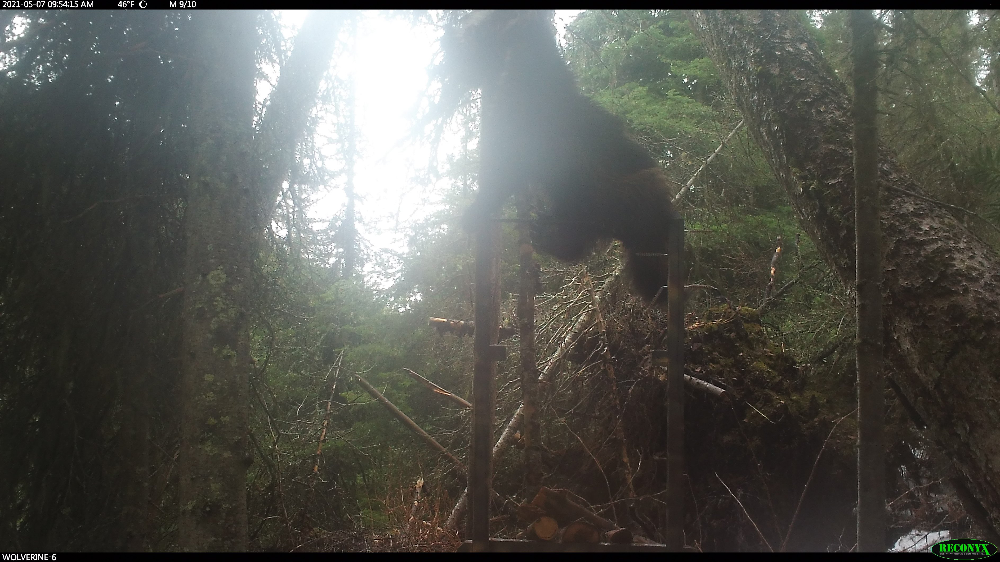

In [23]:
def load_and_decode_image(binary_image_data):
    """Decode binary image data and return an Image object."""
    image = Image.open(io.BytesIO(binary_image_data))
    return image

# Load one of the Parquet chunks
chunk_df = pd.read_parquet('data/parquet/train_0.parquet')

# Assume the encoded images are in the 'image' column
# Choose an image to open, for example, the first one
encoded_image = chunk_df['image'].iloc[0]

# Decode and open the image
image = load_and_decode_image(encoded_image)

# Now you can display or process the image
image

In [22]:
chunk_df['ymdh'].iloc[0], chunk_df['marks'].iloc[0], chunk_df['color'].iloc[0]

('202105072149', 'No', 1)

In [163]:
chunk_df.head()

,image,group,species,id,station,year,color,marks,ymdh,label
0,b'\xff\xd8\xff\xe1%\xa6Exif\x00\x00MM\x00*\x00...,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0
1,b'\xff\xd8\xff\xe1%}Exif\x00\x00MM\x00*\x00\x0...,Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0
2,b'\xff\xd8\xff\xe1)\xf7Exif\x00\x00MM\x00*\x00...,Focal_species,Gulo gulo,BDF10-M6,HC,2020,0,No,202004090034,0
3,"b'\xff\xd8\xff\xe1""<Exif\x00\x00MM\x00*\x00\x0...",Focal_species,Gulo gulo,BDF10-M6,HC,2021,1,No,202105072149,0
4,b'\xff\xd8\xff\xe18\xd8Exif\x00\x00MM\x00*\x00...,Focal_species,Gulo gulo,BDF10-M6,JC,2020,1,No,202004130716,0
